In [0]:
%tensorflow_version 2.x
import os
import csv
import tensorflow as tf
from tensorflow import keras
#import keras
import matplotlib.pyplot as plt
#import cv2
#from keras.models import Model
from tensorflow.keras import Model
import numpy as np
import tensorflow_addons as tfa
import math
tf.__version__

'2.2.0-rc3'

In [0]:
!pip install -U -q kaggle
!mkdir /content/.kaggle
from google.colab import files
files.upload()
os.path.dirname('.kaggle')

In [0]:
import json
token = {"username":"shreegowri","key":"f70a15b60d31ba3eb431bb708868ff16"}
with open('/content/.kaggle/kaggle.json', 'w') as file:
    json.dump({"username":"shreegowri","key":"f70a15b60d31ba3eb431bb708868ff16"}, file)

In [0]:
!cp /content/.kaggle/kaggle.json ~/.kaggle/kaggle.json
!kaggle config set -n path -v{/content}
!chmod 600 /root/.kaggle/kaggle.json
!kaggle competitions download -c ifood-2019-fgvc6 #downloads the files into /content/{/content}/competitions/ifood-2019-fgvc6 directory

In [0]:
import zipfile

train_zip = '/content/{/content}/competitions/ifood-2019-fgvc6/train_set.zip'
zip_ref = zipfile.ZipFile(train_zip, 'r')
zip_ref.extractall('train_set')


train_label_zip = '/content/{/content}/competitions/ifood-2019-fgvc6/train_labels.csv.zip'
zip_ref = zipfile.ZipFile(train_label_zip, 'r')
zip_ref.extractall('train_set/train_set')


val_zip = '/content/{/content}/competitions/ifood-2019-fgvc6/val_set.zip'
zip_ref = zipfile.ZipFile(val_zip, 'r')
zip_ref.extractall('val_set')

test_zip = '/content/{/content}/competitions/ifood-2019-fgvc6/test_set.zip'
zip_ref = zipfile.ZipFile(test_zip, 'r')
zip_ref.extractall('test_set')

zip_ref.close()

In [0]:
def load_csv(filename):
  ''' param: filename of the csv file with train or test images names along with respective labels
      return: the path to images and respective labels of the images
  '''
  dirname = os.path.dirname(filename)
  images_path = []
  labels = []
  with open(filename) as f:
    parsed = csv.reader(f, delimiter=",", quotechar="'")
    for row in parsed:
      if row[1]=='label':
        continue
      images_path.append(os.path.join(dirname, row[0]))
      #print(row[1])
      labels.append(int(row[1]))
  return images_path, labels
train_images_path, train_labels = load_csv('/content/train_set/train_set/train_labels.csv')
val_images_path, val_labels = load_csv ('/content/val_set/val_set/val_labels.csv')
print(len(train_labels))
class_names = np.loadtxt('/content/class_list.txt', dtype={'names': ('class_num', 'class_name'), 'formats': ('i4', 'U100')})
class_names[0][1]

118475


'macaron'

In [0]:
#input_shape = (3, IMAGE_SIZE, IMAGE_SIZE)
HEIGHT = 299
WIDTH = 299
IMG_SHAPE = (HEIGHT, WIDTH, 3)
resize_height = 299
resize_height = 299
means = [123.68, 116.779, 103.939] #ImageNet's mean, change to training data mean

def preprocess_train(x,y):
  ''' param: path to the image with its label
      task: reads image from directory, resizes an image to 256 x 256, then randomly crops to 224 x 224
      return: the augmented and centered data
  '''
  x = tf.io.read_file(x) #read images
  x = tf.image.decode_jpeg(x, dct_method="INTEGER_ACCURATE", channels=3) #decode jpeg images
  x = tf.image.convert_image_dtype(x, tf.float32)
  x = tf.image.resize(x, (resize_height, resize_height), antialias=False) #Resizes an image to a target width and height by keeping the aspect ratio the same without distortion.
  #x = tf.image.random_crop(x, [HEIGHT, WIDTH, 3]) #Randomly crops a tensor to a given size
  #x = tf.image.central_crop(x, 0.875)  #as we 224/256 = 0.875 central cropping the image
  #x = tf.image.random_flip_left_right(x)  #flips the image along width with 0.5 probability
  x = tf.keras.applications.inception_v3.preprocess_input(x)
  return x,y

In [0]:
def preprocess_val(x,y):
  ''' similar to preprocess_train but uses center crop after resize
  '''
  x = tf.io.read_file(x)
  x = tf.image.decode_jpeg(x, dct_method="INTEGER_ACCURATE", channels=3)
  x = tf.image.convert_image_dtype(x, tf.float32)
  x = tf.image.resize(x, [resize_height, resize_height], antialias=False)
  #x = tf.image.resize_with_pad(x, resize_height, resize_height, antialias=False)
  #x = tf.image.central_crop(x, 0.875)  #as we 224/256 = 0.875 central cropping the image
  x = tf.keras.applications.inception_v3.preprocess_input(x)
  return x,y

In [0]:
#define the TF datset with batchsize, shuffling and preprocessing
BATCH_SIZE = 32 #change and see if performance improves, 1024 resource not enough
num_train_examples = len(train_images_path)
Num_Classes = len(set(train_labels))
train_dataset = tf.data.Dataset.from_tensor_slices((train_images_path, train_labels)).shuffle(4000, reshuffle_each_iteration=True).map(preprocess_train, num_parallel_calls=tf.data.experimental.AUTOTUNE).batch(BATCH_SIZE)
val_dataset = tf.data.Dataset.from_tensor_slices((val_images_path, val_labels)).map(preprocess_val).batch(32)

In [0]:
def show_batch(image_batch, label_batch):
  plt.figure(figsize=(15,15))
  for n in range(25):
      ax = plt.subplot(5,5,n+1)
      plt.imshow(image_batch[n])
      plt.title(class_names[label_batch[n]][1])
      plt.axis('off')
  plt.show()

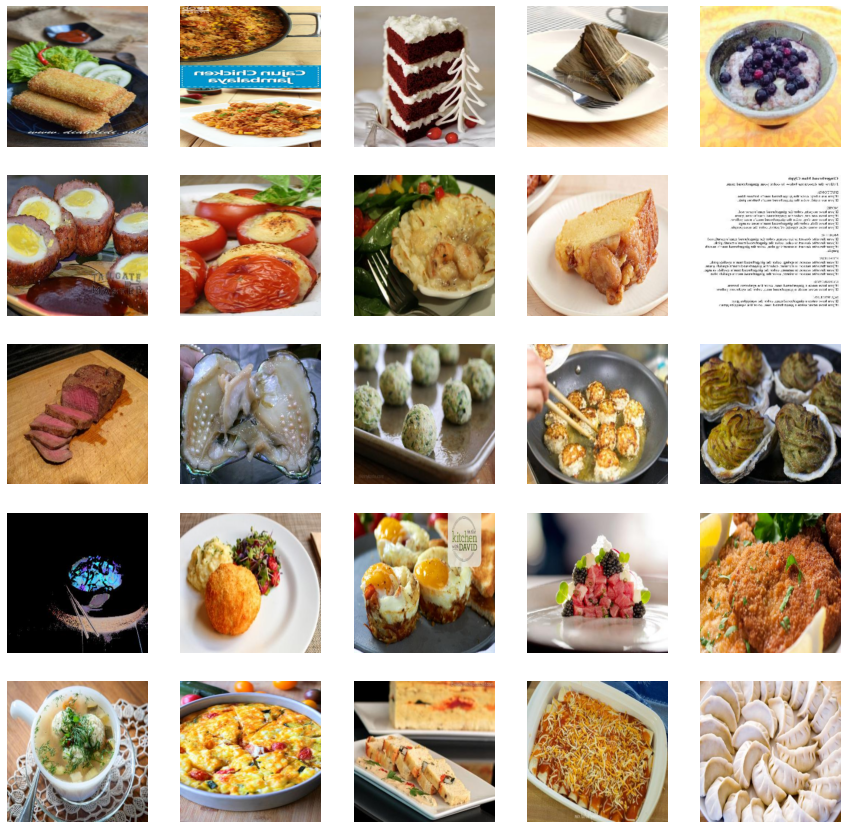

In [0]:
for image, label in train_dataset.take(1):
  show_batch(image, label)

In [0]:
base_model = tf.keras.applications.InceptionV3(input_shape=(299,299,3), weights = "imagenet", include_top = False) #input_shape = (224,224,3),
for layer in base_model.layers:
  layer.trainable=True
#last_layer = base_model.get_layer('post_relu')
last_output = base_model.layers[-1].output
x = tf.keras.layers.GlobalAveragePooling2D(name='avg_pool')(last_output)
#x = tf.keras.layers.Dropout(0.5)(x)
x = tf.keras.layers.Dense(251, activation='softmax', name='prediction')(x)
model = tf.keras.models.Model(base_model.input, x, name='model')

In [0]:
# Clear any logs from previous runs
!rm -rf ./logs/ 
#Adding tensorboard callbacks

from tensorflow.keras.callbacks import TensorBoard
import datetime

log_dir="logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")

tensorboard_callback = TensorBoard(log_dir=log_dir, update_freq='batch', histogram_freq=1)

In [0]:
#!pip install -q tqdm
from tqdm import tqdm

In [0]:
#Train the model

num_epochs = 80
model.compile(optimizer = tf.keras.optimizers.SGD(learning_rate=0.001, momentum=0.9), loss = 'sparse_categorical_crossentropy', metrics=['accuracy'])
#saves the model after every epoch
cp_path = "/content/drive/My Drive/training_val/cp.ckpt" #path to save the model
cp_dir = os.path.dirname(cp_path)
cp_callback = tf.keras.callbacks.ModelCheckpoint(filepath=cp_path, save_weights_only=True,  period=10, verbose=1)
model.save_weights(cp_path.format(epoch=0))
history = model.fit(train_dataset, epochs = num_epochs, validation_data = val_dataset, callbacks = [tensorboard_callback, cp_callback])


In [0]:
%load_ext tensorboard

%tensorboard --logdir logs/fit

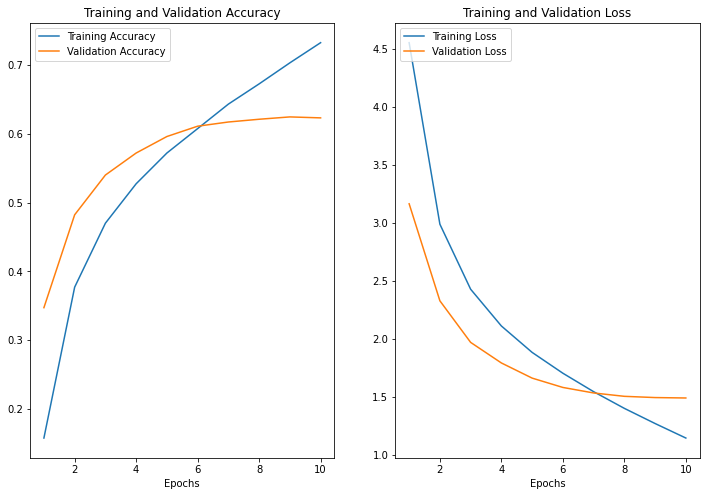

In [0]:
train_accuracy_results = [0.1577,0.377,0.47,0.5273,0.572,0.6075,0.6431,0.6725,0.7031,0.7324]
val_accuracy_results = [0.3472,0.4822,0.54,0.572,0.596,0.611,0.6171,0.6211,0.6245,0.6231]
train_loss_results = [4.5518, 2.9867, 2.4262,2.1092,1.8815,1.7019,1.5428,1.3989,1.2682,1.1431]
val_loss_results = [3.1627,2.3262,1.9678,1.7904,1.6598,1.5793,1.5317,1.5027,1.4920,1.4884]
epochs_range = range(1,len(val_loss_results)+1)

plt.figure(figsize=(12, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, train_accuracy_results, label='Training Accuracy')
plt.plot(epochs_range, val_accuracy_results, label='Validation Accuracy')
plt.legend(loc='upper left')
plt.xlabel("Epochs")
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, train_loss_results, label='Training Loss')
plt.plot(epochs_range, val_loss_results, label='Validation Loss')
plt.xlabel("Epochs")
plt.legend(loc='upper left')
plt.title('Training and Validation Loss')
plt.show()


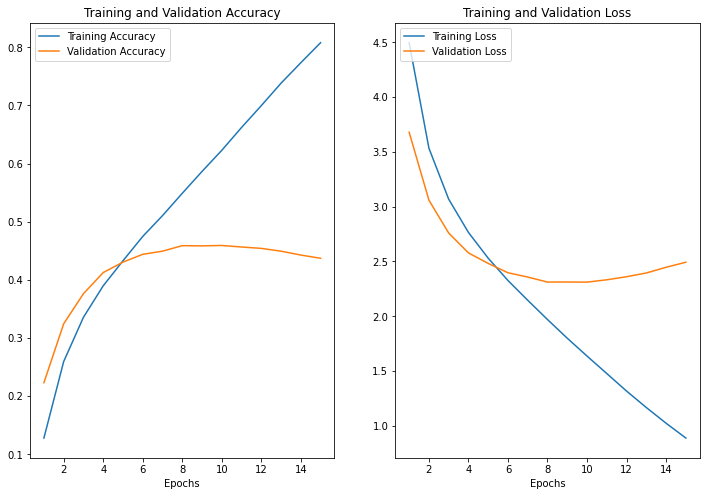

In [0]:
train_accuracy_results = [0.128,0.2595,0.3356,0.3897,0.4328,0.4746,0.5104,0.5488,0.5864,0.6227,0.662,0.6996,0.7382,0.7734,0.8078]
val_accuracy_results = [0.2231,0.3244,0.3762,0.4125,0.4305,0.4439,0.4493,0.4588,0.4584,0.4591,0.4565,0.4541,0.4493,0.4426,0.4371]
train_loss_results = [4.4966,3.5341,3.0689,2.765,2.53,2.3264,2.1461,1.9704,1.7998,1.6371,1.4774,1.3175,1.1674,1.0241,0.8889]
val_loss_results = [3.6795,3.0597,2.7596,2.5784,2.4824,2.3971,2.3579,2.3123,2.3128,2.3115,2.3329,2.3609,2.395,2.4472,2.4931]
epochs_range = range(1,len(val_loss_results)+1)

plt.figure(figsize=(12, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, train_accuracy_results, label='Training Accuracy')
plt.plot(epochs_range, val_accuracy_results, label='Validation Accuracy')
plt.legend(loc='upper left')
plt.xlabel("Epochs")
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, train_loss_results, label='Training Loss')
plt.plot(epochs_range, val_loss_results, label='Validation Loss')
plt.xlabel("Epochs")
plt.legend(loc='upper left')
plt.title('Training and Validation Loss')
plt.show()


In [0]:
model.load_weights("/content/drive/My Drive/training_val/cp.ckpt")

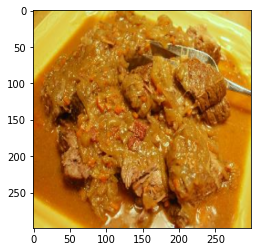

In [0]:
for image, lab in val_dataset.take(1):
  img = image[10]
from matplotlib.pyplot import imshow
plt.imshow(img)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:43: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


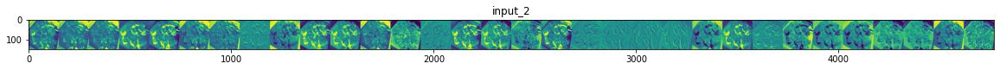

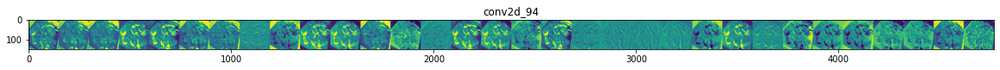

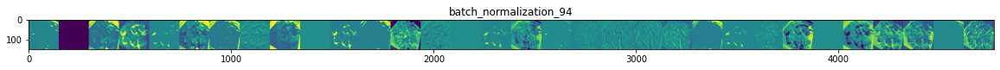

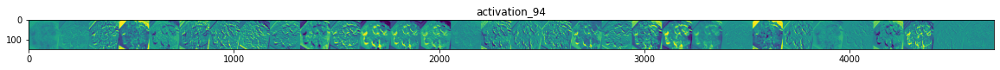

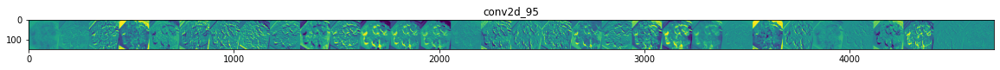

...

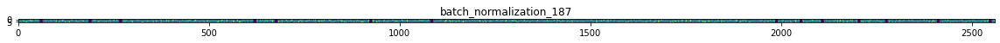

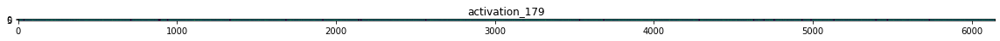

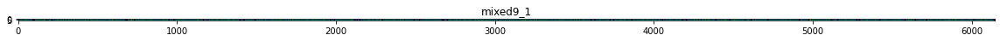

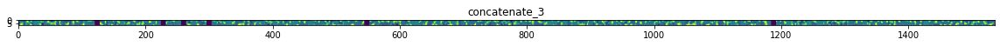

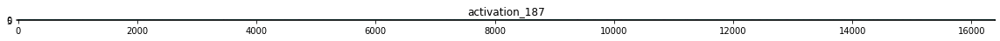

In [0]:
from tensorflow.keras.preprocessing.image import img_to_array, load_img
for image, lab in val_dataset.take(1):
  img = image[10]

# Let's define a new Model that will take an image as input, and will output
# intermediate representations for all layers in the previous model after
# the first.
successive_outputs = [layer.output for layer in model_2.layers[1:]]
#visualization_model = Model(img_input, successive_outputs)

visualization_model = tf.keras.models.Model(inputs = model.input, outputs = successive_outputs) #new model with previous model except first layer

# Let's prepare a random input image from the training set.
x = img_to_array(img)  # Numpy array with shape (150, 150, 3)
x = x.reshape((1,) + x.shape)  # Numpy array with shape (1, 150, 150, 3)

# Let's run our image through our network, thus obtaining all
# intermediate representations for this image.
successive_feature_maps = visualization_model.predict(x)

# These are the names of the layers, so can have them as part of our plot
layer_names = [layer.name for layer in model.layers]

# Now let's display our representations
for layer_name, feature_map in zip(layer_names, successive_feature_maps):
  if len(feature_map.shape) == 4:
    # Just do this for the conv / maxpool layers, not the fully-connected layers
    n_features = feature_map.shape[-1]  # number of features/filters in feature map
    # The feature map has shape (1, size, size, n_features)
    size = feature_map.shape[1]
    # We will tile our images in this matrix
    display_grid = np.zeros((size, size * n_features))
    for i in range(n_features):
      # Postprocess the feature to make it visually palatable
      x = feature_map[0, :, :, i]
      x -= x.mean()
      x /= x.std()
      x *= 64
      x += 128
      x = np.clip(x, 0, 255).astype('uint8')  #clip/limit the values in an array
      # We'll tile each filter into this big horizontal grid
      display_grid[:, i * size : (i + 1) * size] = x
    # Display the grid
    scale = 20. / n_features
    plt.figure(figsize=(scale * n_features, scale))
    plt.title(layer_name)
    plt.grid(False)
    plt.imshow(display_grid, aspect='auto', cmap='viridis')

In [0]:
predictions = model.predict(val_dataset)

In [0]:
predictions

In [0]:
validation_dataset = tf.data.Dataset.from_tensor_slices((val_images_path, val_labels)).shuffle(11994).map(preprocess_val).batch(32)
for img,lab in validation_dataset.take(1):
  test_labels = lab.numpy()
  test_images = img.numpy()


In [0]:
def plot_image(i, predictions_array, true_label, img):
  predictions_array, true_label, img = predictions_array, true_label[i], img[i]
  plt.grid(False)
  plt.xticks([])
  plt.yticks([])

  plt.imshow(img, cmap=plt.cm.binary)

  predicted_label = np.argmax(predictions_array)
  if predicted_label == true_label:
    color = 'blue'
  else:
    color = 'red'

  plt.xlabel("{} {:2.0f}% ({})".format(class_names[predicted_label],
                                100*np.max(predictions_array),
                                class_names[true_label]),
                                color=color)

def plot_value_array(i, predictions_array, true_label):
  predictions_array, true_label = predictions_array, true_label[i]
  plt.grid(False)
  plt.xticks(range(10))
  plt.yticks([])
  thisplot = plt.bar(range(10), predictions_array, color="#777777")
  plt.ylim([0, 1])
  predicted_label = np.argmax(predictions_array)

  thisplot[predicted_label].set_color('red')
  thisplot[true_label].set_color('blue')

In [0]:
pred = model.predict(test_images)

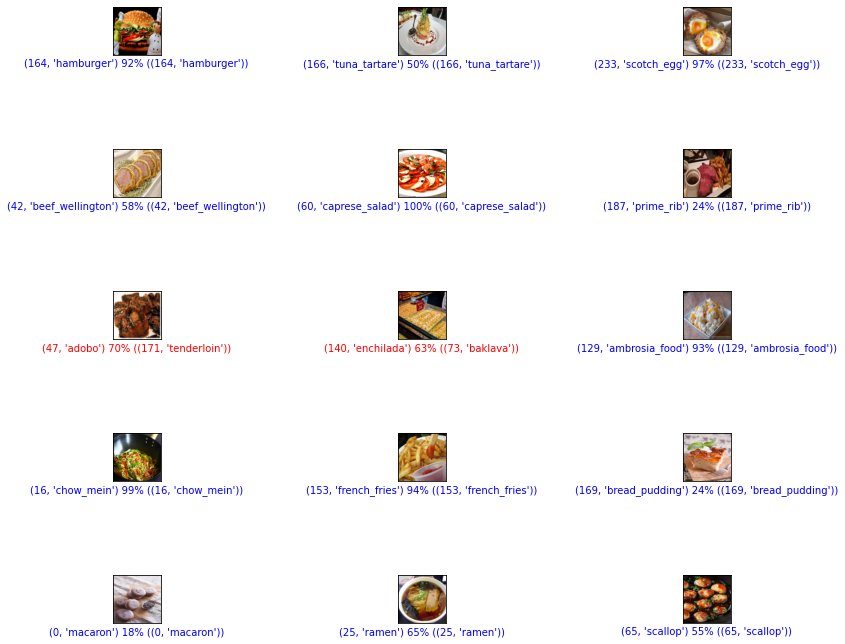

In [0]:
num_rows = 5
num_cols = 3
num_images = num_rows*num_cols
plt.figure(figsize=(2*2*num_cols, 2*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1) #plt.title(class_names[label_batch[n]][1])
  plot_image(i, pred[i], test_labels, test_images)
  #plt.subplot(num_rows, 2*num_cols, 2*i+2)
  #plot_value_array(i, pred[i], test_labels)
plt.tight_layout()
plt.show()

In [0]:
predicted = tf.math.argmax(predictions, axis=1)
predicted

<tf.Tensor: shape=(11994,), dtype=int64, numpy=array([247, 234, 222, ...,  72,  49, 138])>

In [0]:
#Top-3 accuracy
res=(tf.math.in_top_k(predictions=predictions, targets=val_labels, k=3)).numpy()

In [0]:
np.sum(res)/11994

0.8114057028514257

In [0]:
model_2.load_weights('/content/drive/My Drive/AML_Project/incp') 